In [1]:
from speann import SpeannModel
from speann.speann import ModelContext
from speann.speann import States
from speann.speann import HHStates
from speann.speann import AuxiliaryStates
from speann.speann import SynapticPlasticityStates
from speann.speann import ModelData
#importlib.reload(speann)

import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import seaborn as sns
import math

dtype = torch.float
device = ("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using {device} device")

Using mps device


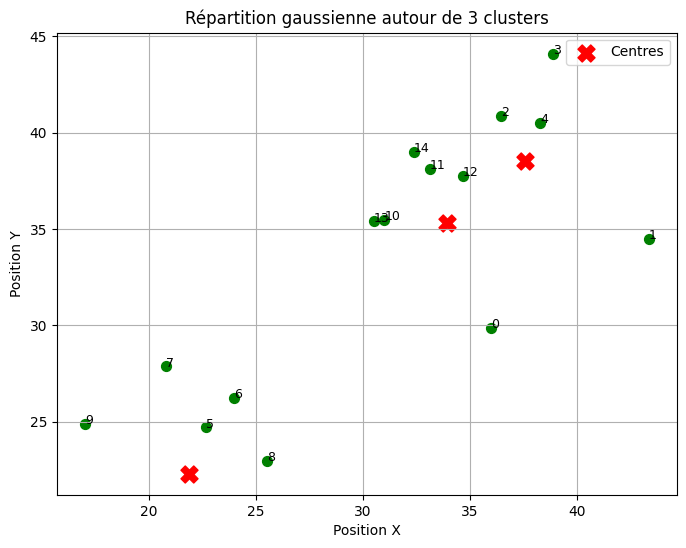

Matrice D (distribution en clusters):
[[ 0.          8.72176685 11.04162487 14.53720295 10.88769518 14.28201573
  12.51144377 15.30493112 12.51142954 19.60102926  7.51347075  8.73591646
   8.02346189  7.78069202  9.80821757]
 [ 8.72176685  0.          9.41083575 10.58950982  7.85391817 22.90386544
  21.04852658 23.51231983 21.23181256 28.04098773 12.39597631 10.84633095
   9.26848726 12.87955778 11.84337379]
 [11.04162487  9.41083575  0.          4.03252458  1.87952029 21.26496649
  19.2231028  20.35431473 20.99178376 25.16537583  7.66919549  4.32047842
   3.57500243  8.08946575  4.4719635 ]
 [14.53720295 10.58950982  4.03252458  0.          3.65273141 25.29216328
  23.25060746 24.30011535 25.00625765 29.10386213 11.67582771  8.30031181
   7.59025946 12.0810064   8.25868135]
 [10.88769518  7.85391817  1.87952029  3.65273141  0.         22.22053817
  20.1830383  21.56754823 21.68470552 26.37734026  8.8396454   5.67578585
   4.51039074  9.30039137  6.07690678]
 [14.28201573 22.90386544 2

In [2]:
# Paramètres
num_clusters = 3              # Nombre de clusters
neurons_per_cluster = 5 #5      # Nombre de neurones par cluster
scale = 40                   # Domaine global pour les centres de clusters
cluster_std = 3               # Écart-type pour la répartition gaussienne dans chaque cluster

# Génération des centres de clusters (répartition homogène)
cluster_centers = np.random.uniform(0, scale, (num_clusters, 2))

# Génération des coordonnées pour chaque cluster (distribution gaussienne)
coords_list = []
for center in cluster_centers:
    # 10 neurones autour du centre
    coords_cluster = np.random.normal(loc=center, scale=cluster_std, size=(neurons_per_cluster, 2))
    coords_list.append(coords_cluster)
    
# Concaténation de toutes les positions
coords = np.vstack(coords_list)

# Calcul de la matrice des distances euclidiennes
D_cluster = cdist(coords, coords)

# Visualisation
plt.figure(figsize=(8, 6))
plt.scatter(coords[:, 0], coords[:, 1], c='green', s=50)
for i in range(coords.shape[0]):
    plt.text(coords[i, 0], coords[i, 1], f'{i}', color='black', fontsize=9)
# Optionnel : afficher également les centres de clusters
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='X', s=150, label="Centres")
plt.title("Répartition gaussienne autour de 3 clusters")
plt.xlabel("Position X")
plt.ylabel("Position Y")
plt.grid(True)
plt.legend()
plt.show()

D_tensor = torch.tensor(D_cluster, dtype=dtype, device=device)
D = D_tensor/2
D

print("Matrice D (distribution en clusters):")
print(D_cluster)

In [3]:
N = num_clusters * neurons_per_cluster #15
T = 100 # batch size
t = torch.linspace(0, T-1, T, dtype=dtype, device=device)

context = ModelContext(
    time_steps= T,
    neuron_count= N,
    dtype= dtype,
    device= device
)


In [4]:

S_null = torch.zeros(T, N, device=device)
#S = torch.zeros((T, N), dtype=dtype, device=device)

# Variables
X = torch.zeros((T, N), dtype=dtype, device=device)

uf = -54.4 #-55.       #u_fire/threshold seuil d'activation : [-55mV] #0.00042233815 #0.0002   #0.00042233815, nij, 10, 1, 100
u0 = -65 #-70.6      #u_rest: potentiel au repos
uS = 50 #30.        #u_spike/peak: potentiel en action
uh = -77 #-80        #u_hyporpolarization
#alpha_u = 0.98  # Dissipation of u
#beta_u = 5      # ionic factor (ionic boost)

U = torch.full((T, N), u0, dtype=dtype, device=device)
V = torch.full((T, N, N), u0, dtype=dtype, device=device)

w0 = 0.2#.499 #0.1999999508261705 #0.3333332389 #0.25 #(uf*eta_X/k_S)*num_clusters/neurons_per_cluster /1.8 #eta_X/k_S ~ eta_X/k_R
W = torch.full((T, N, N), w0, dtype=dtype, device=device)-w0*torch.eye(N, dtype=dtype, device=device) # we actually do not need to batch W in time: here we do so in order to check the evolution of W for scientific reasons

epsilon = 1         #<-- [1ms]
#lambda_ = 0.05 # between 1% and 10% (facteur de décroissance/oubli dans les poids en discret)
c_0 = 1
Theta_0 = D / c_0 # in 3 dimensions, there is a finite nb of nodes at a fixed distance 1... 4 dimensions in space-time
c = torch.full((T, N), c_0, dtype=dtype, device=device)
Theta = torch.tensor(
    #np.transpose(
        np.full( (T, N, N), Theta_0.cpu().numpy() ),
    #    (1, 2, 0)
    #),
    dtype=dtype, device=device
)
nij = torch.ceil(Theta / epsilon).int()

states = States(
    x= X,
    u= U,
    v= V,
    w= W,
    nij= nij,
    s= S_null
)


In [5]:

XX = torch.zeros((T, N), dtype=dtype, device=device)
XXX = torch.zeros((N,N), dtype=dtype, device=device)
_X_ = torch.zeros((T,N,N), dtype=dtype, device=device)

auxiliary_states = AuxiliaryStates(
    xx= XX,
    xxx= XXX,
    x_= _X_
)


In [6]:
UP = U[-1] #torch.zeros((T, N), dtype=dtype, device=device) 
UD = U[-1] #torch.zeros((T, N), dtype=dtype, device=device) 
#Y_ = torch.zeros((T, N, N), dtype=dtype, device=device) 
#P_ = torch.zeros((T, N), dtype=dtype, device=device) 
#Z_ = torch.zeros((T, N, N), dtype=dtype, device=device)
Y = torch.zeros((N, N), dtype=dtype, device=device) 
P = torch.zeros((N), dtype=dtype, device=device) 
Z = torch.zeros((N, N), dtype=dtype, device=device)

plasticity_states = SynapticPlasticityStates(
    up= UP,
    ud= UD,
    y= Y,
    p= P,
    z= Z
)

In [7]:

k_R = 1 #2 #5     # --- 100 action potential : 5ms
k_S = 1 #2     # spike : 1 + 1 ms : dépolarisation (1ms from -70,6 to +30mV) + repolarisation (1ms)
            #  hyperpolarisation (-80mV): 1ms
            # back to resting state: 1-2ms
# Constants
#D = torch.ones((N, N), dtype=dtype, device=device)-torch.eye(N, dtype=dtype, device=device)
eta_A = 10 #15 #25 # inutile : il n'y a pas de baisse du signal le long d'un axone
g_int_no_myelin = 0.1 # Conductance of the axon (not myelinated) in mS/cm²
eta_X = 200.     #<-- [100ms] #50

C_m = 1.0  # µF/cm²
g_Na, g_K, g_L, g_Ca = 120,  36,   0.3,  0.2 #0.3,  0.5/10  # mS/cm²
E_Na, E_K, E_L, E_Ca =  50, -77, -54.4, 120 #60, -88, -54.387, 120  # mV 40, -84, -60, 120  # mV

#------Tag------
eta_P = 200##50 #100         #<-- [100ms]
eta_D = 500 #1000        #<-- [1s]
AL = 0.01##0.01 #100*0.01       #<-- [0.01]
AH = 0.1##0.014 #100*0.014      #<-- [0.014]
uL = u0             #<-- [-70.6mV]
uH = -50.           #<-- [-50mV] 
#Theta_LTP = -50     #<-- [-50mV]    
#Theta_LTD = -70.6   #<-- [-70.6mV]  

kL = 1/3000 #1/150         #<-- [1/1.5h]   #1/(1.5*60*60*1000)
kH = 1/2000 #1/100         #<-- [1/h]      #1/(60*60*1000)
p_y1 = torch.tensor([kL, 1 - kL, 0], dtype=dtype, device=device) # proba passage 1->0, 1->1, 1->2
p_y1 = p_y1.expand(N, N, 3)
p_y2 = torch.tensor([kH, 0, 1 - kH], dtype=dtype, device=device) # proba passage 2->0, 2->1, 2->2
p_y2 = p_y2.expand(N, N, 3)

alpha = 0.5         #<-- [0.5]

#-----Trigger-----
kP = 1/200            #<-- [1/6mn] #6*60*1000
NP = N*5/100 ##40/100       #<-- [40] #40
tau_P = 2000.       #<-- [60min]

#-----Consolidation-----
eta_Z = 1000 ##200    #<-- [6mn] #*1000
gamma = 0.5##0.1     #<-- [0.1]
beta  = 2.      #<-- [2.]
N_z_ini = 0.3   #<-- [30 / 100]

alpha_M = 1.1
beta_M = 0.05
gamma_M = 0.02

indices0 = torch.tensor([0,1,2,3,4], device=device)
indices1 = torch.tensor([5,6,7,8,9], device=device)
indices2 = torch.tensor([10,11,12,13,14], device=device)

parameters = {
    "epsilon": epsilon,
    "k_R": k_R,
    "k_S": k_S,
    "eta_X": eta_X,
    "uf": uf,
    "u0": u0,
    "uS": uS,
    "uh": uh,
    "eta_P": eta_P,
    "eta_D": eta_D,
    "AL": AL,
    "AH": AH,
    "uL": uL,
    "uH": uH,
    "kL": kL,
    "kH": kH,
    "p_y1": p_y1,
    "p_y2": p_y2,
    "alpha": alpha,
    "kP": kP,
    "NP": NP,
    "tau_P": tau_P,
    "eta_Z": eta_Z,
    "gamma": gamma,
    "beta": beta,
    "N_z_ini": N_z_ini,
    "c_0": c_0,
    "D": D, 
    "w0": w0,
    "alpha_M": alpha_M,
    "beta_M": beta_M,
    "gamma_M": gamma_M,
    "neurons_per_cluster": neurons_per_cluster,
    "num_clusters": num_clusters,
    "scale": scale,
    "C_m": C_m,
    "g_Na": g_Na,
    "g_K": g_K,
    "g_L": g_L,
    "g_Ca": g_Ca,
    "E_Na": E_Na,
    "E_K": E_K,
    "E_L": E_L,
    "E_Ca": E_Ca,
    "eta_A": eta_A,
    "g_int_no_myelin": g_int_no_myelin  # Conductance of the axon (not myelinated)
}

In [8]:
v = torch.full((N,), -65.0, device=device)
m = torch.full((N,), 0.05, device=device)
h = torch.full((N,), 0.6, device=device)
n = torch.full((N,), 0.32, device=device)

hhstates = HHStates(
    v=v,
    m=m,
    h=h,
    n=n,
    m_ca=0.
)

In [9]:
data = ModelData(
    states=states,
    hhstates=hhstates,
    auxilary_states=auxiliary_states,
    plasticity_states=plasticity_states,
    context=context,
    parameters=parameters
)

In [10]:
def plot(f, t):
    fig, ax = plt.subplots()
    ax.plot(t.cpu().numpy(), f.cpu().numpy())
    plt.show()

def plot_V(Vector, i, t):
    t_V_i = torch.transpose(Vector, 1, 0)[i]
    plot(t_V_i, t)

def plot_M(Matrix, i, j, t):
    t_M_ij = torch.transpose(torch.transpose(Matrix, 1, 0), 1, 2)[i][j]
    plot(t_M_ij, t)

def raster_plot_X(X, t_):
    N=X.size()[1]
    T=X.size()[0]
    t=torch.linspace(0, T-1, T, dtype=dtype, device=device) 
    plt.figure(figsize=(N*3, 20))#4))
    neuronal_states_np = torch.transpose(X,  1, 0).cpu().numpy()
    for i in range(N):
        values = neuronal_states_np[i]
        mask = values > 0
        active_times = t[mask].cpu().numpy()
        activity_levels = values[mask]
        #active_times = t[neuronal_states_np[i] == 1].cpu().numpy()
        #plt.scatter(active_times, [i]*len(active_times), marker='|', color='black', s=100)
        plt.scatter(active_times, [i]*len(active_times), 
                    marker='|', c=activity_levels, cmap = "viridis",
                    s=activity_levels*100, alpha=0.7, edgecolor='black')

    plt.title("Neuronal states (Raster plot)", fontsize=14)
    plt.xlabel("Time (t)", fontsize=12)
    plt.ylabel("Neurons", fontsize=12)
    plt.yticks(range(N), [f"Neuron {i}" for i in range(N)])
    plt.colorbar(label="Intensity of neuronal activity")  # Ajout de la légende pour les couleurs
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    plt.show()

def raster_plot_X_continuous(X):
    N = X.size(1)
    T = X.size(0)
    t = torch.linspace(0, T - 1, T, dtype=X.dtype, device=X.device).cpu().numpy()
    
    plt.figure(figsize=(N * 3, 20))
    
    neuronal_states_np = torch.transpose(X, 1, 0).cpu().numpy()
    min_value, max_value = np.min(neuronal_states_np), np.max(neuronal_states_np)

    for i in range(N):
        values = neuronal_states_np[i]  # Toutes les valeurs continues
        active_times = t  # On garde tout le temps
        activity_levels = values  # Intensité utilisée pour la coloration

        # Scatter avec plage continue de couleurs
        plt.scatter(active_times, [i] * len(active_times), 
                    marker='|', c=activity_levels, cmap='viridis', 
                    s=50, alpha=0.8, edgecolors='black', vmin=min_value, vmax=max_value)

    plt.title("Neuronal States (Continuous Raster Plot)", fontsize=14)
    plt.xlabel("Time (t)", fontsize=12)
    plt.ylabel("Neurons", fontsize=12)
    plt.yticks(range(N), [f"Neuron {i}" for i in range(N)])
    
    # Ajouter une barre de couleur pour visualiser l'intensité
    plt.colorbar(label="Neuron activity intensity")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    plt.show()


def raster_plot_U(U, t_, title, ylabel):
    N=U.size()[1]
    T=U.size()[0]
    t=torch.linspace(0, T-1, T, dtype=dtype, device=device)
    plt.figure(figsize=(N*3,20))
    t_U = torch.transpose(U,  1, 0)
    for i in range(N):
        #active_times = t[neuronal_states_np[i] == 1].cpu().numpy()
        plt.plot(t.cpu().numpy(), t_U.cpu().numpy()[i] + i*3, label=f"Neuron {i}")

    plt.title(title, fontsize=14)
    plt.xlabel("Time (t)", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    #plt.yticks(range(N), [f"Neuron {i}" for i in range(N)])
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    plt.legend(loc="upper right", fontsize=10, bbox_to_anchor=(1.2, 1.05))
    plt.show()

def multi_plot(U, t, title, ylabel):
    N=U.size()[1]
    plt.figure(figsize=(N*6,20))
    t_U = U.permute(1, 2, 0)
    for i in range(N):
        for j in range(N):
            #active_times = t[neuronal_states_np[i] == 1].cpu().numpy()
            plt.plot(t.cpu().numpy(), t_U.cpu().numpy()[i][j] + i*10, label=f"Neuron {i} -> Neuron {j}")

    plt.title(title, fontsize=14)
    plt.xlabel("Time (t)", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    #plt.yticks(range(N), [f"Neuron {i}" for i in range(N)])
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    plt.legend(loc="upper right", fontsize=10, bbox_to_anchor=(1.2, 1.05))
    plt.show()



def plot_heatmaps(tenseur, num_heatmaps):
    """
    Affiche des cartes de chaleur pour un tenseur TxNxN à plusieurs instants de temps.
    
    Paramètres :
        tensor (numpy.ndarray) : Tenseur de taille TxNxN représentant l'évolution des matrices dans le temps.
        num_heatmaps (int) : Nombre de heatmaps à afficher (doit être <= T).
    
    Retour :
        Affiche une figure avec les heatmaps.
    """
    tensor = tenseur.cpu().numpy()
    T, N, _ = tensor.shape  # Dimensions du tenseur TxNxN
    
    # Vérifier que le nombre de heatmaps est valide
    if num_heatmaps > T:
        raise ValueError("Le nombre de heatmaps demandé dépasse le nombre de pas de temps disponibles.")
    
    # Sélection des instants de temps à afficher
    selected_times = np.linspace(0, T-1, num_heatmaps, dtype=int)  # Temps uniformément répartis
    matrices = tensor[selected_times, :, :]  # Extraire les matrices aux temps sélectionnés

    # Déterminer l'échelle uniforme pour toutes les heatmaps
    vmin = max(0, tensor.min())  # Valeur minimale
    vmax = min(10*w0, tensor.max())  # Valeur maximale

    # Déterminer la disposition des sous-graphiques
    num_rows = int(np.ceil(np.sqrt(num_heatmaps)))  # Nombre de lignes
    num_cols = int(np.ceil(num_heatmaps / num_rows))  # Nombre de colonnes

    # Création des heatmaps
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))  # Taille ajustée
    axes = axes.flatten()  # Aplatir pour itérer facilement

    for idx, (t, ax) in enumerate(zip(selected_times, axes)):
        sns.heatmap(matrices[idx], ax=ax, cmap="viridis", cbar=True, annot=False, linewidths=0.5, vmin=vmin, vmax=vmax)
        ax.set_title(f"Temps t={t}", fontsize=12)
        ax.set_xlabel("Colonnes")
        ax.set_ylabel("Lignes")
    
    # Supprimer les axes inutilisés si num_heatmaps ne remplit pas la grille
    for ax in axes[len(selected_times):]:
        ax.axis("off")  # Désactiver les graphiques vides

    # Ajustement global
    plt.suptitle(f"Évolution des matrices à {num_heatmaps} instants sélectionnés", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

"""
fig, ax = plt.subplots(2,1)
#fig 1
ax[0].plot(t.cpu().numpy(), xx.cpu().numpy())
ax[0].set_title("Spike transform")
#fig 2
ax[1].plot(t.cpu().numpy(), xxx.cpu().numpy())
ax[1].set_title("Delay transform")
#plotting
plt.show()
"""

def multi_plot_M(U, t_, title, ylabel):
    N=U.size()[1]
    T = U.size()[0]
    t = torch.linspace(0, T-1, T, dtype=dtype, device=device)
    plt.figure(figsize=(N*6,20))
    t_U = U.permute(1, 2, 0)
    for i in range(N):
        for j in range(N):
            #active_times = t[neuronal_states_np[i] == 1].cpu().numpy()
            plt.plot(t.cpu().numpy(), t_U.cpu().numpy()[i][j] + i*0.2, label=f"Neuron {i} -> Neuron {j}")

    plt.title(title, fontsize=14)
    plt.xlabel("Time (t)", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    #plt.yticks(range(N), [f"Neuron {i}" for i in range(N)])
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    plt.legend(loc="upper right", fontsize=10, bbox_to_anchor=(1.2, 1.05))
    plt.show()

def multi_plot_M2(U, t_, title, ylabel):
    N = U.size(1)
    T = U.size(0)
    t = torch.linspace(0, T - 1, T, dtype=U.dtype, device=U.device).cpu().numpy()

    t_U = U.permute(1, 2, 0).cpu().numpy()

    # Trouver les min/max globaux pour uniformiser l'échelle Y
    y_min, y_max = np.min(t_U), np.max(t_U)

    # Création de plusieurs sous-graphiques empilés
    fig, axes = plt.subplots(N, N, figsize=(10, 10), sharex=True, sharey=True)
    fig.suptitle(title, fontsize=16)

    for i in range(N):
        for j in range(N):
            ax = axes[i, j]  # Sélection du sous-graphique
            ax.plot(t, t_U[i][j], label=f"Neuron {i} -> Neuron {j}", color="black")
            ax.set_ylim(y_min, y_max)  # Fixe l'échelle Y pour tous les graphiques
            ax.set_ylabel(ylabel, fontsize=10)
            ax.grid(True, alpha=0.3)
            
            if i == N - 1:
                ax.set_xlabel("Time (t)", fontsize=12)
            if j == 0:
                ax.set_title(f"Neuron {i} → {j}", fontsize=10)

    plt.tight_layout()
    plt.show()

def plot_clustered_weights_M(W, t_, T_):
    T = W.size()[0]    
    t = torch.linspace(0, T-1, T, dtype=dtype, device=device)
    W_reshaped = W.view(T, num_clusters, neurons_per_cluster, num_clusters, neurons_per_cluster)
    W_avg = W_reshaped.mean(dim=(2, 4))
    multi_plot_M2(W_avg, t, "évolution moyenne des poids par cluster", "poids moyens par cluster") 

def plot_clustered_weights(W, t, T):    
    W_reshaped = W.view(T, num_clusters, neurons_per_cluster, num_clusters, neurons_per_cluster)
    W_avg = W_reshaped.mean(dim=(2, 4))
    multi_plot(W_avg, t, "évolution moyenne des poids par cluster", "poids moyens par cluster") 

def plot_weights(W):
    T = W.size()[0]    
    t = torch.linspace(0, T-1, T, dtype=dtype, device=device)
    multi_plot_M2(W, t, "évolution des poids", "poids")


In [11]:
modèle = SpeannModel(data=data)

In [15]:
itérations = 5
i_, j_, k_ = 0, 1, 14 # indices des neurones à observer
epochs_, repetitions_, pause_ = 50, 5, 5
print("itération 1")
resultats = modèle.train(i=i_, j=j_, k=k_, epochs=epochs_, repetitions=repetitions_, pause=pause_)

itération 1
--------------- Simulation step 1/7 ---------------------------
--------------- Simulation step 2/7 ---------------------------
--------------- Simulation step 3/7 ---------------------------
--------------- Simulation step 4/7 ---------------------------
--------------- Simulation step 5/7 ---------------------------
--------------- Simulation step 6/7 ---------------------------
--------------- Simulation step 7/7 ---------------------------
--------------- Simulation completed ---------------------------
--------------- Simulation step 1/6 ---------------------------
--------------- Simulation step 2/6 ---------------------------
--------------- Simulation step 3/6 ---------------------------
--------------- Simulation step 4/6 ---------------------------
--------------- Simulation step 5/6 ---------------------------
--------------- Simulation step 6/6 ---------------------------
--------------- Simulation completed ---------------------------
--------------- Simulation

In [18]:
resX, resW, resU, res_X, resY, resZ, resP = resultats[0], resultats[1], resultats[2], resultats[3], resultats[4], resultats[5], resultats[6]

heatmaps W


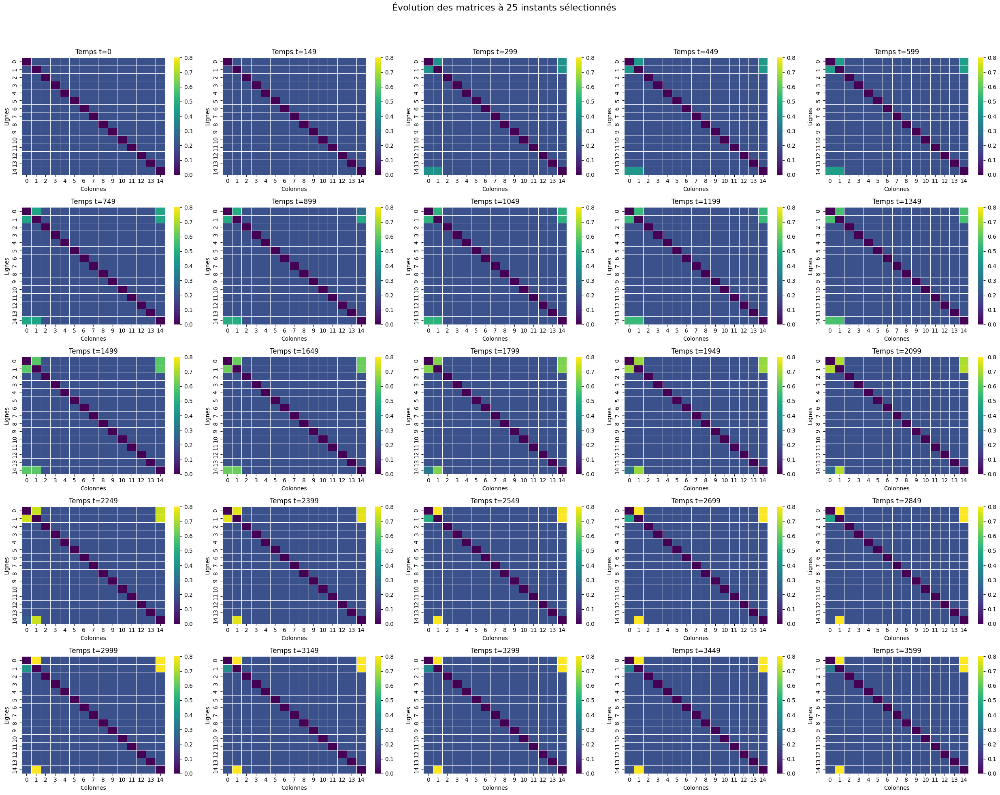

clustered W


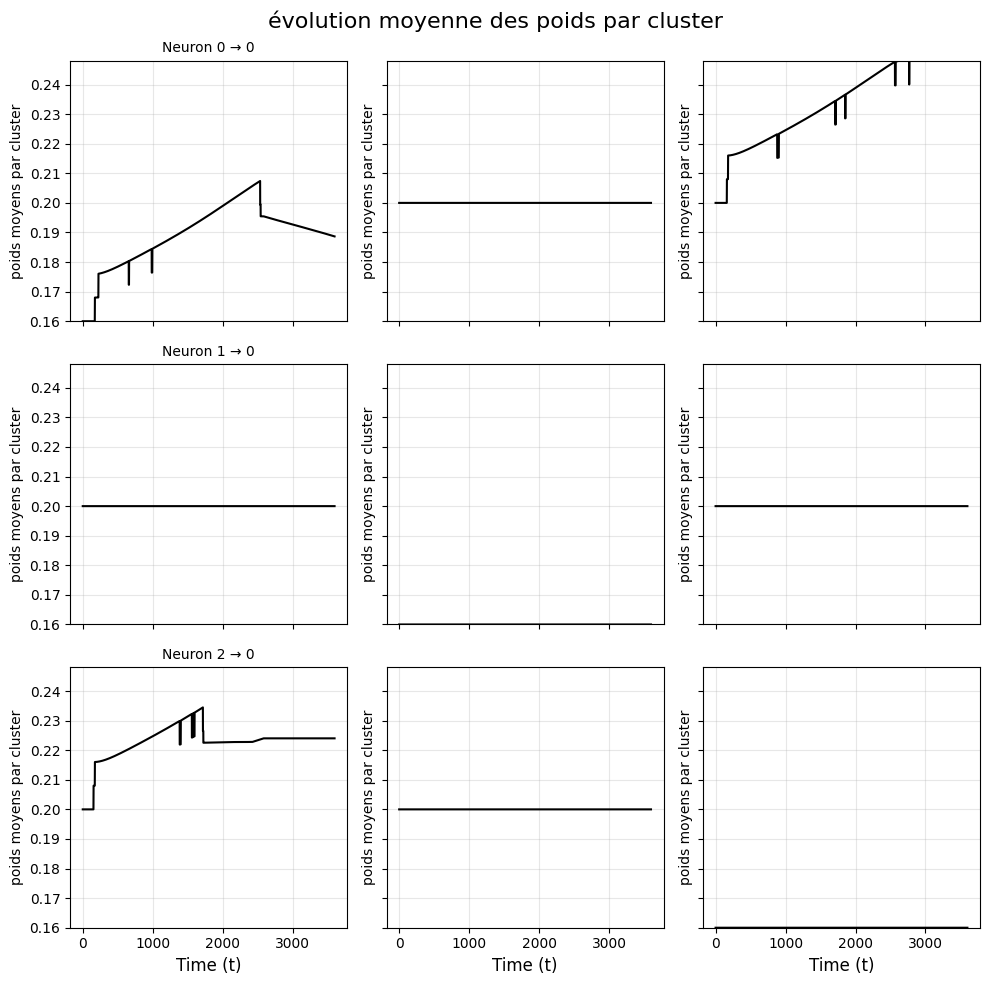

raster X


/var/folders/bm/4s5sh7jj0n3dhylz0n0wmg_w0000gq/T/ipykernel_98471/424025336.py:27: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('|').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(active_times, [i]*len(active_times),


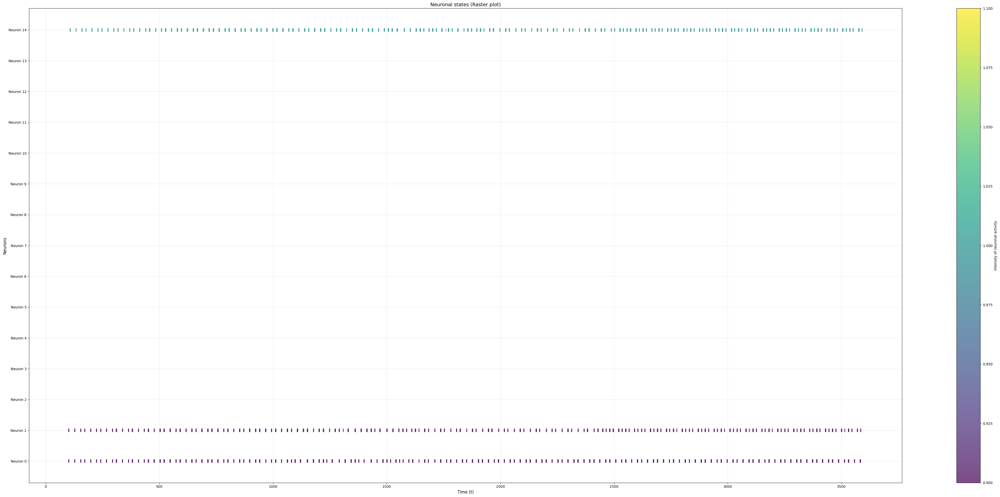

Neuronal activity
tensor([[545.4249, 330.3087, 298.7820, 244.4683, 298.7820, 244.4683, 270.2645,
         244.4683, 270.2645, 200.0260, 365.1608, 330.3087, 330.3087, 365.1608,
         330.3087],
        [339.6326, 560.9349, 339.6326, 307.2033, 375.4841, 168.2323, 185.9935,
         168.2323, 185.9935, 124.4948, 277.8704, 307.2033, 339.6326, 277.8704,
         307.2033],
        [  0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000],
        [  0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000],
        [  0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000],
        [  0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.

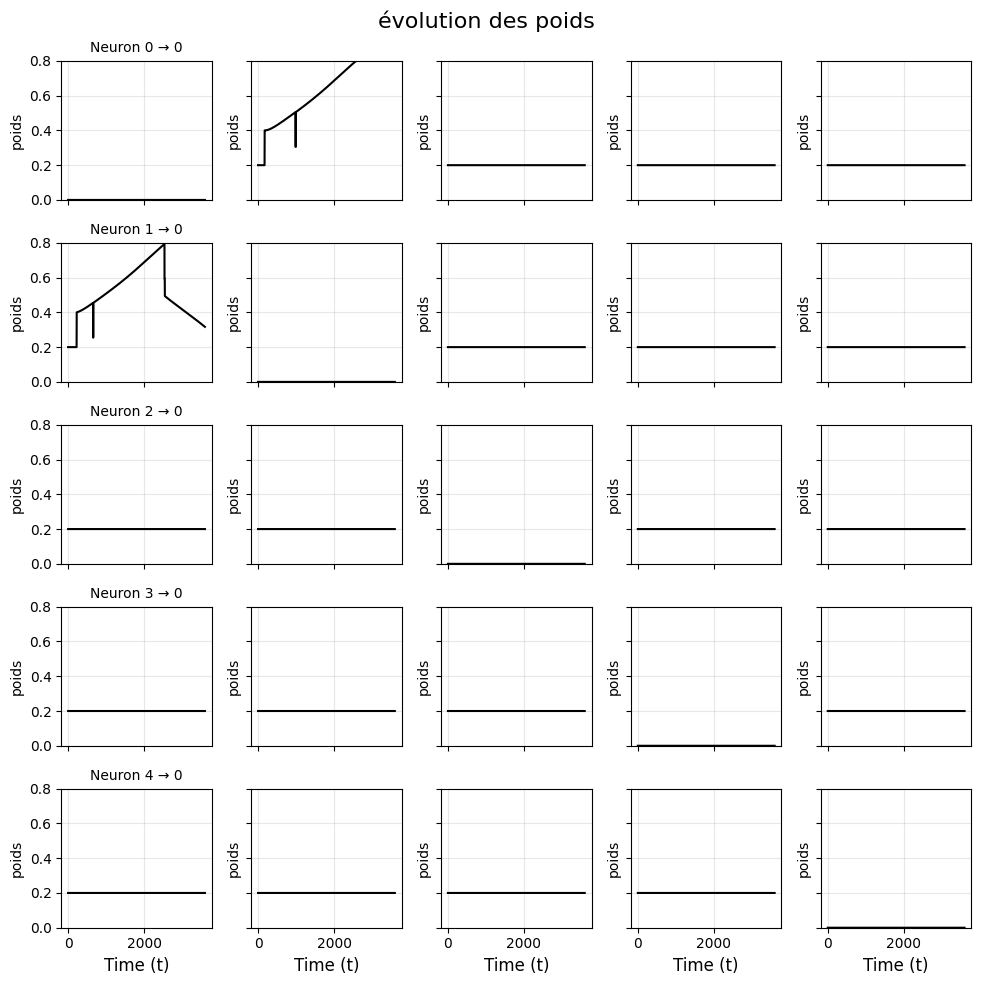

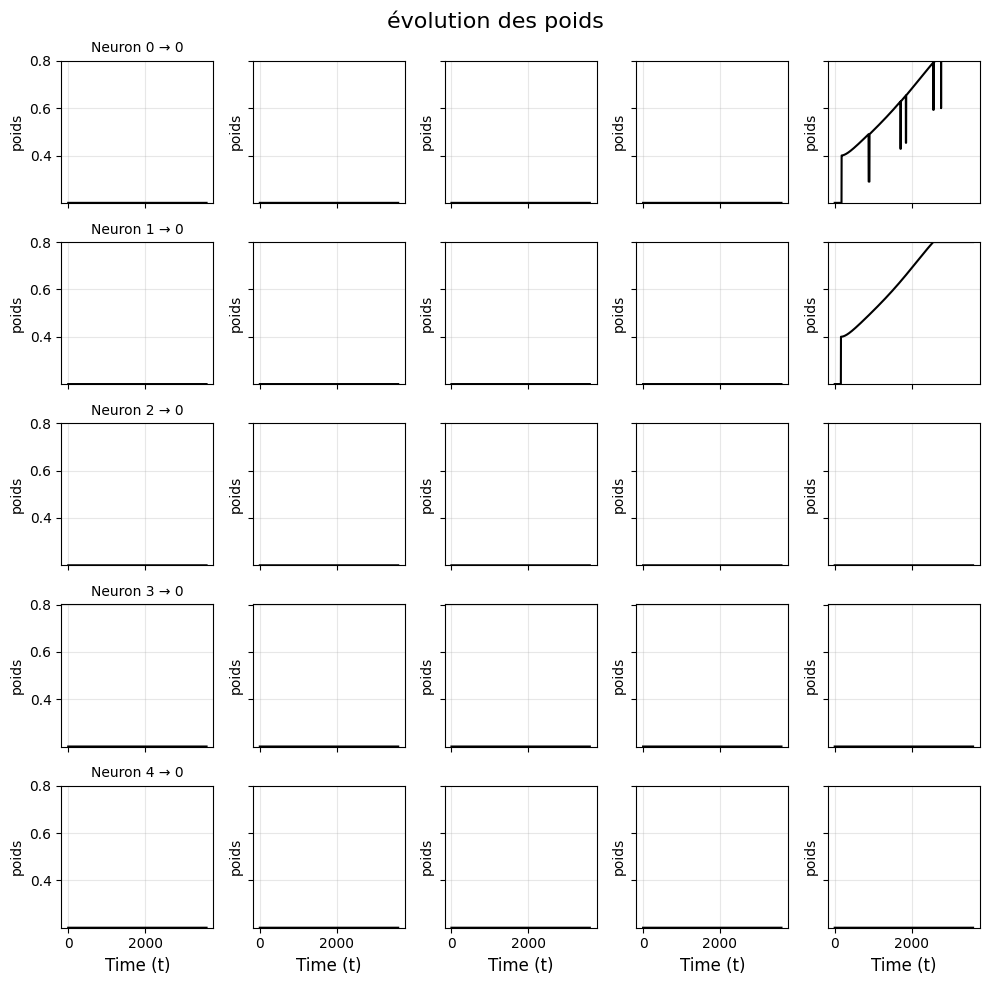

In [19]:
print("heatmaps W")
plot_heatmaps(resW, 25)
print("clustered W")
plot_clustered_weights_M(resW, t, T)
print("raster X")
raster_plot_X(resX, t)

print("Neuronal activity")
print(res_X_.sum(0))
print("Result _X_")
print([f"{x:.2f}" for x in res_X_[-1].sum(1).tolist()])

plot_weights(resW[:, indices0, :][:, :,indices0])
plot_weights(resW[:, indices0, :][:, :,indices2])

In [37]:
resX_, resW_, resU_, res_X_, resY_, resZ_, resP_ = resultats[0], resultats[1], resultats[2], resultats[3], resultats[4], resultats[5], resultats[6]
for k in range(1, itérations):
    resX_ += resultats[k*7+0]
    resW_ += resultats[k*7+1]
    resU_ += resultats[k*7+2]
    res_X_ += resultats[k*7+3]
    resY_ += resultats[k*7+4]
    resZ_ += resultats[k*7+5]
    resP_ += resultats[k*7+6]
resX = resX_ / itérations
resW = resW_ / itérations
resU = resU_ / itérations
res_X = res_X_ / itérations
resY = resY_ / itérations
resZ = resZ_ / itérations
resP = resP_ / itérations
    

heatmaps W


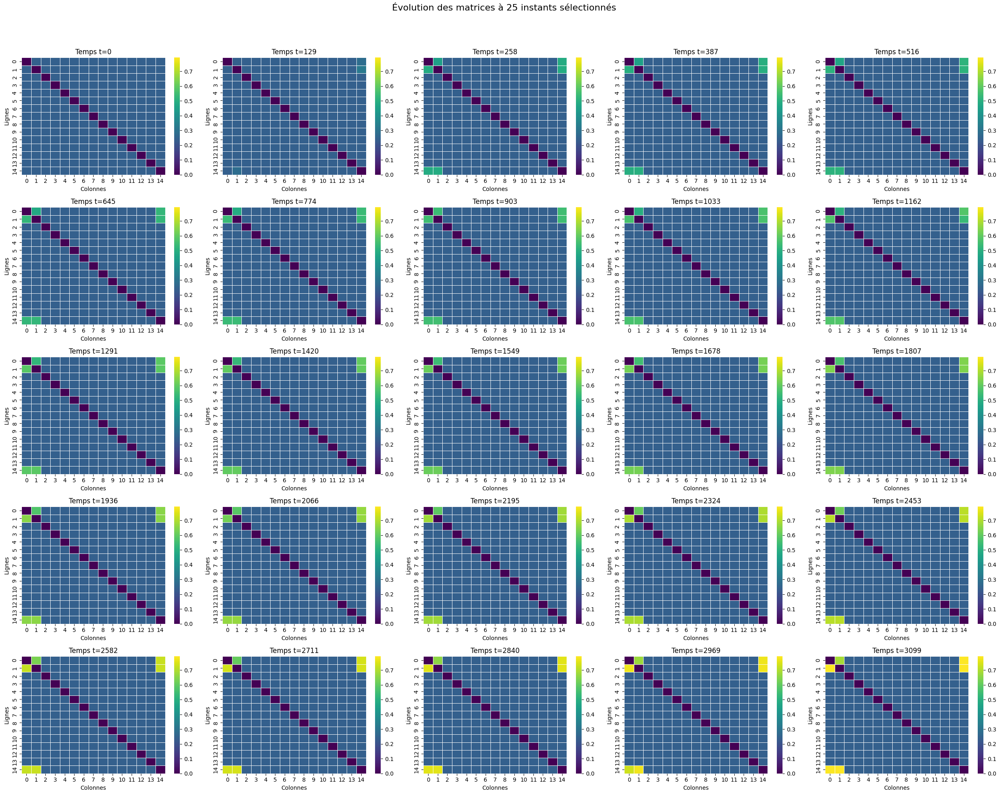

clustered W


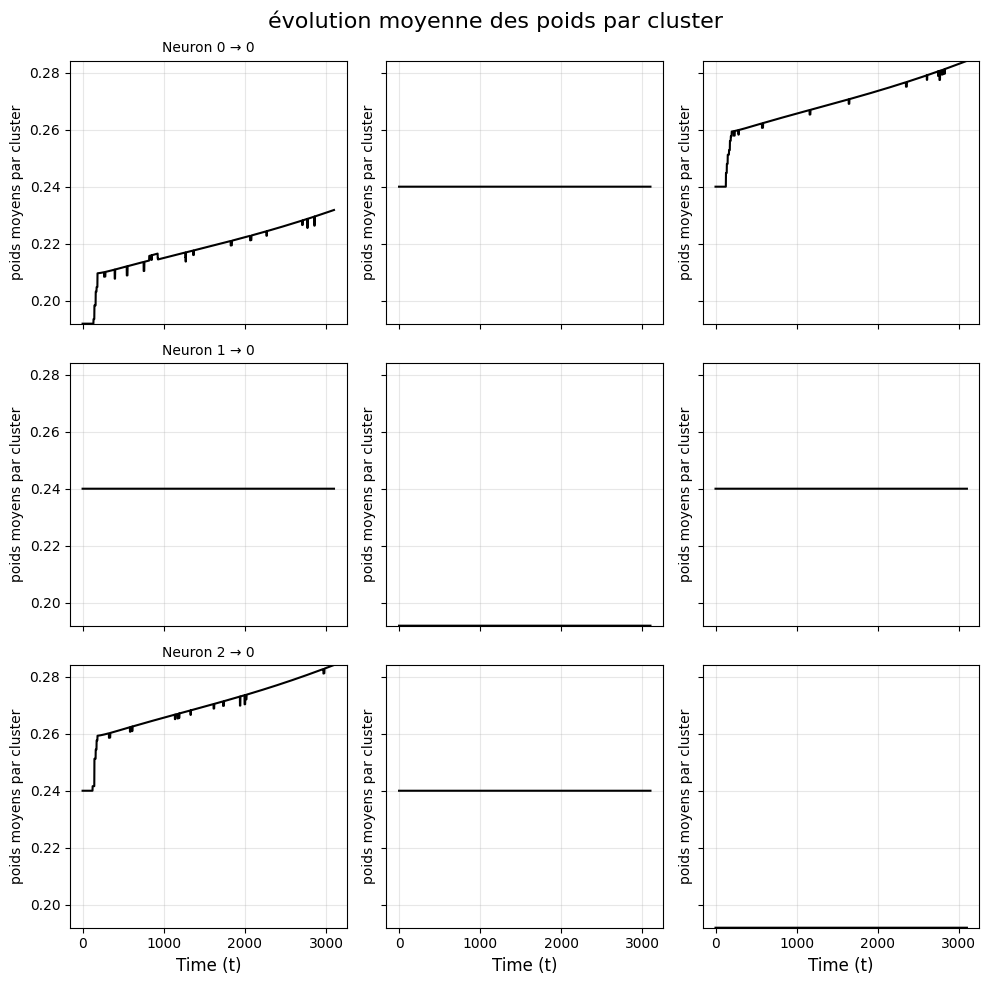

raster X


/var/folders/bm/4s5sh7jj0n3dhylz0n0wmg_w0000gq/T/ipykernel_76768/424025336.py:27: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('|').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(active_times, [i]*len(active_times),


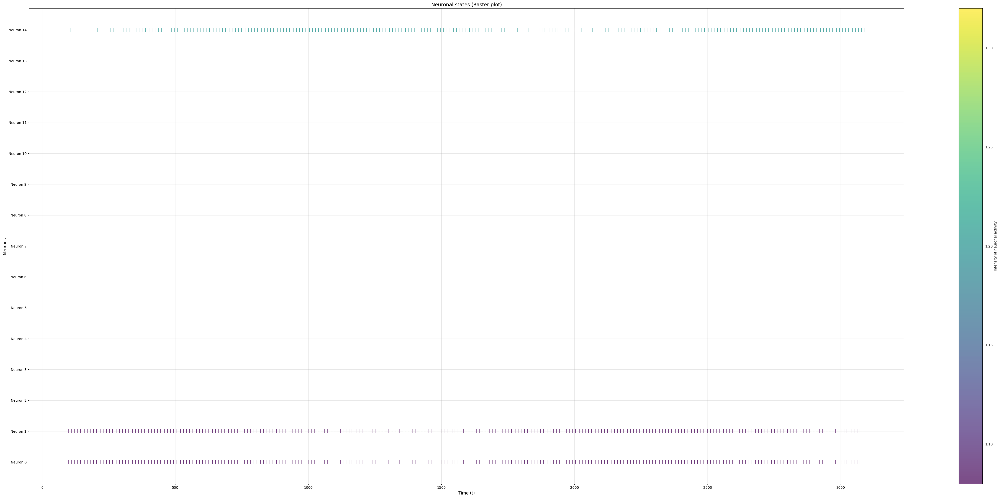

Neuronal activity
tensor([[1399.9998,  937.1439,  937.1439, 1036.0670, 1145.4302,  627.2950,
          567.3964,  513.2153,  513.2153,  343.5146,  766.7275,  766.7275,
          937.1439,  693.5165,  847.6649],
        [ 937.1439, 1399.9998, 1036.0670, 1145.4302, 1145.4302,  693.5165,
          627.2950,  513.2153,  627.2950,  419.8789, 1036.0670,  766.7275,
         1036.0670,  847.6649, 1036.0670],
        [   0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000],
        [   0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000],
        [   0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
            0.0000,    0.0000,    0.0000],
        [   0.000

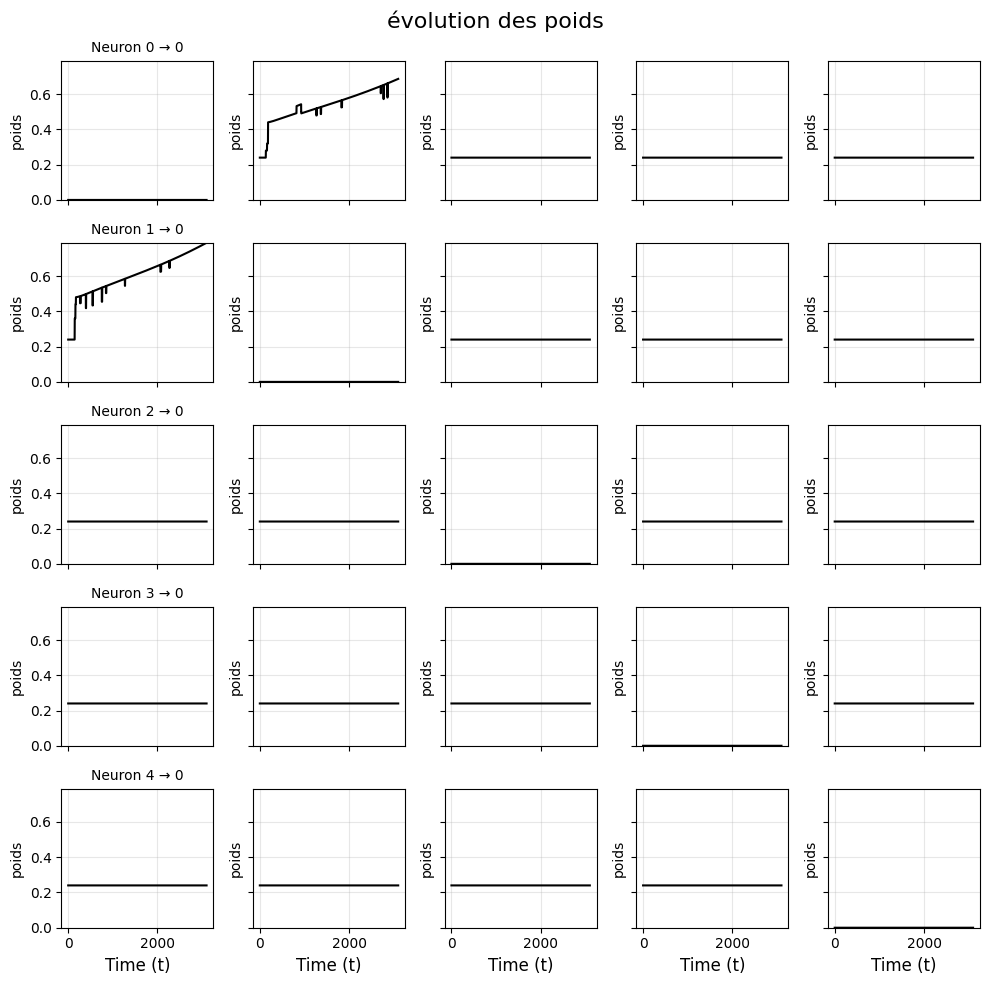

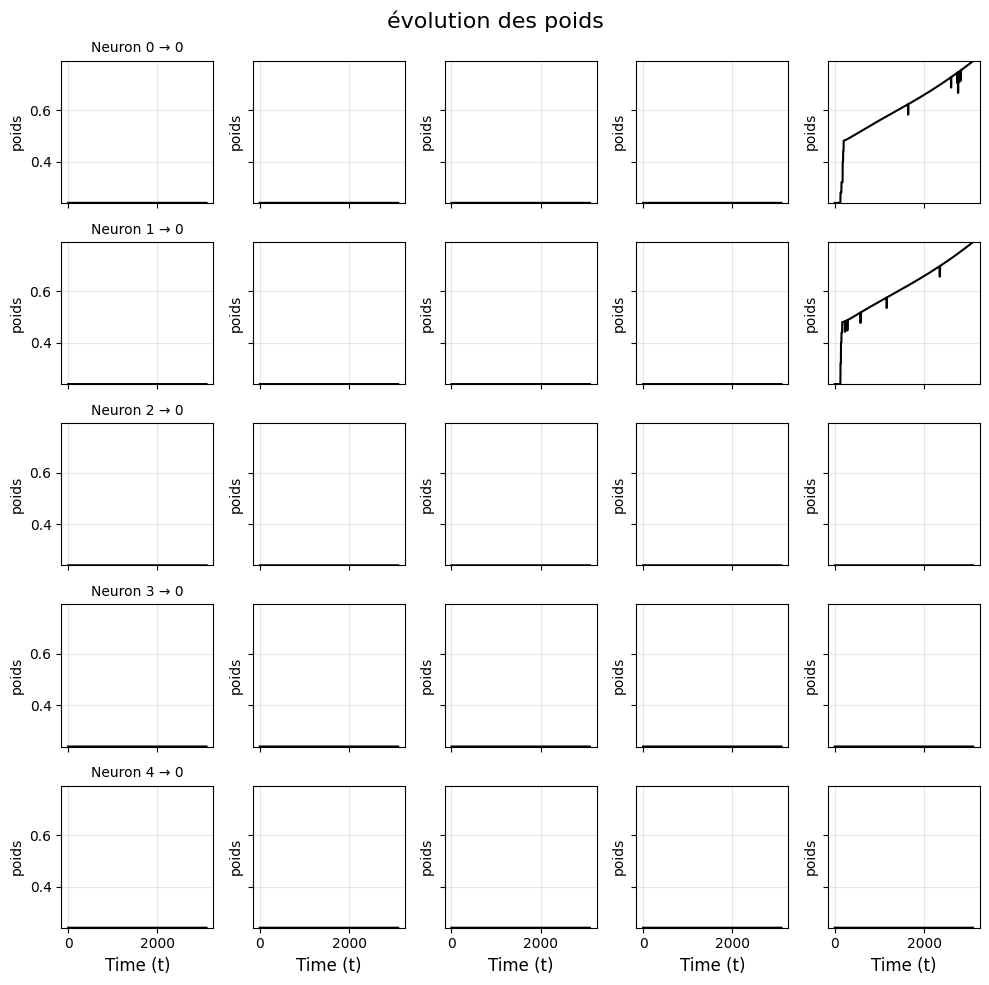

In [39]:
#resultats = resultats / itérations

print("heatmaps W")
plot_heatmaps(resW, 25)
print("clustered W")
plot_clustered_weights_M(resW, t, T)
print("raster X")
raster_plot_X(resX, t)

print("Neuronal activity")
print(res_X_.sum(0))
print("Result _X_")
print([f"{x:.2f}" for x in res_X_[-1].sum(1).tolist()])

plot_weights(resW[:, indices0, :][:, :,indices0])
plot_weights(resW[:, indices0, :][:, :,indices2])

In [5]:
model = SPEANN_Model(S_null, X, W, nij, XX, XXX, _X_, UP, UD, Y, P, Z, parameters)

-------------------------Simulation step 1/9-------------------------------------
_X_(1) tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0299, 0.0329, 0.0437, 0.0362, 0.0329, 0.0169, 0.0154, 0.0140, 0.0154,
         0.0105, 0.0272, 0.0204, 0.0247, 0.0204, 0.0272],
        [0.0329, 0.0362, 0.0362, 0.0437, 0.0362, 0.0204, 0.0186, 0.0154, 0.0169,
         0.0127, 0.0299, 0.0225, 0.0272, 0.0225, 0.0299],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.00

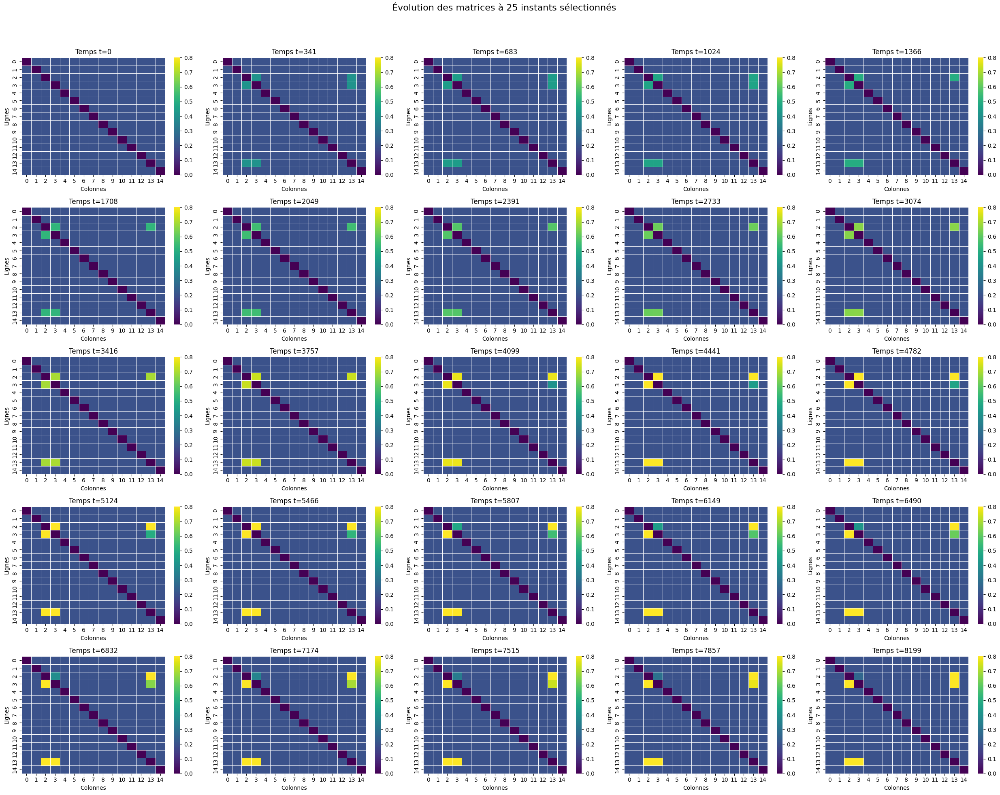

clustered W


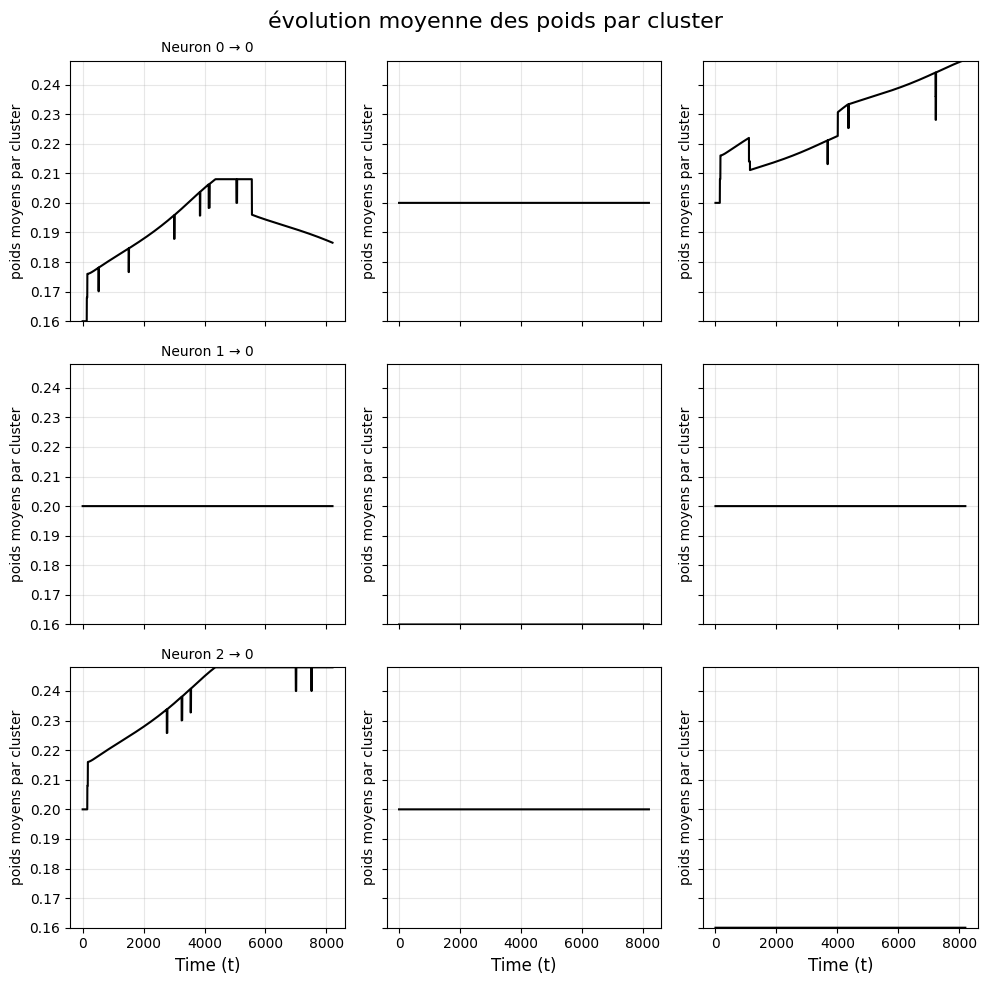

raster X


/var/folders/bm/4s5sh7jj0n3dhylz0n0wmg_w0000gq/T/ipykernel_76768/424025336.py:27: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('|').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(active_times, [i]*len(active_times),


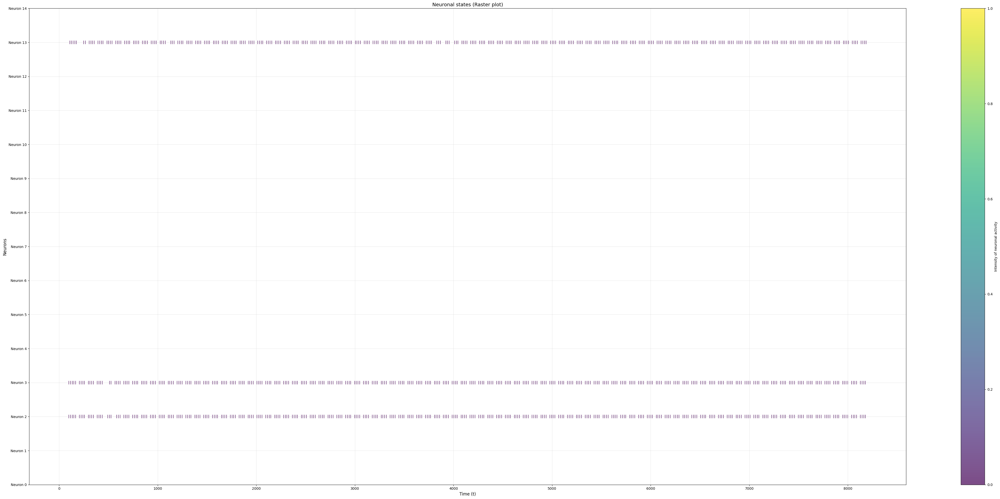

Neuronal activity
tensor([0.0866, 0.0978, 0.1017, 0.1038, 0.0952, 0.0754, 0.0685, 0.0579, 0.0668,
        0.0447, 0.0886, 0.0810, 0.0866, 0.0889, 0.0918], device='mps:0')
tensor([0.0000, 0.0000, 3.0000, 2.4088, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 3.0000, 0.0000], device='mps:0')
Result
['0.00', '0.00', '0.37', '0.40', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.46', '0.00']


In [12]:
results = model.train(i=2, j=3, k=13, epochs=30, repetitions=5, pause=5)

print("heatmaps W")
plot_heatmaps(results[1], 25)
print("clustered W")
plot_clustered_weights_M(results[1], t, T)
print("raster X")
raster_plot_X(results[0], t)

#print("nij")
#print(nij[0])
#print(model.nij[-2000])
#print(model.nij[-1])

print("Neuronal activity")
print(model._X_[-1].sum(0))
print(model.Z.sum(0))

print("Result")
print([f"{x:.2f}" for x in model._X_[-1].sum(1).tolist()])


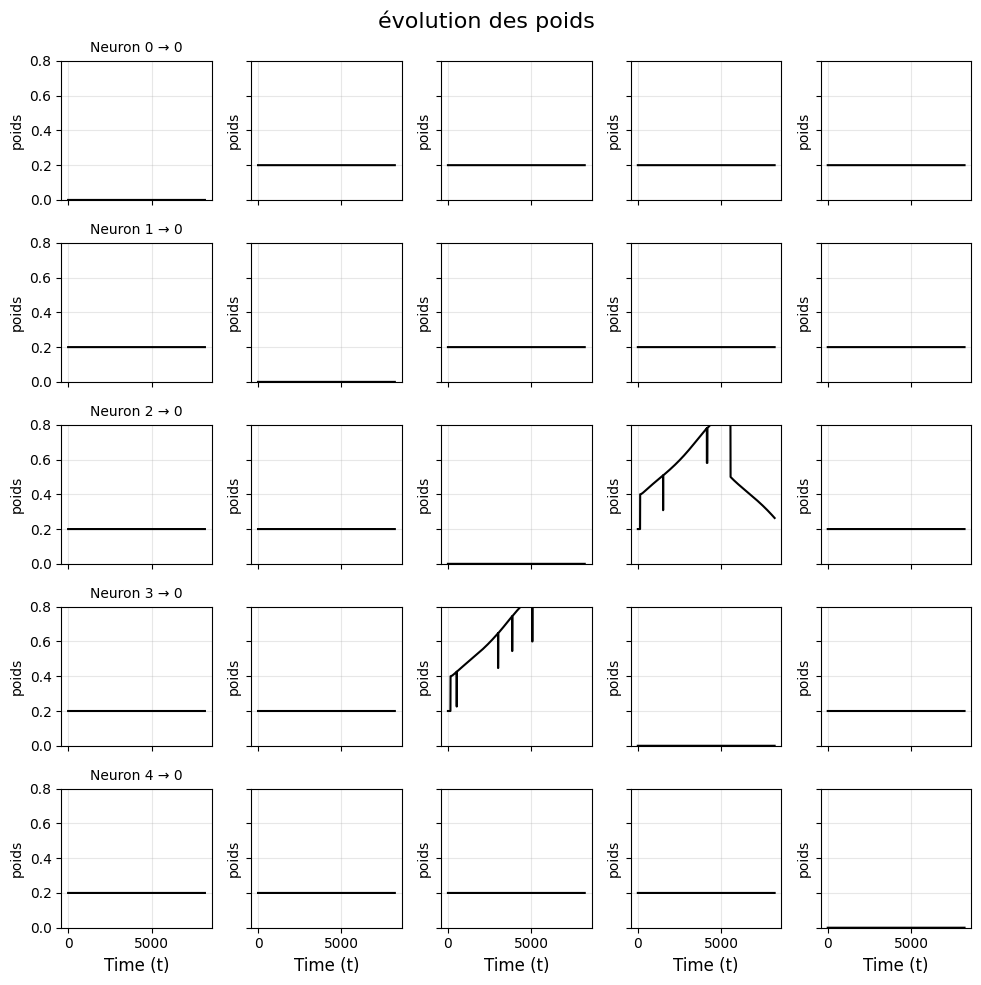

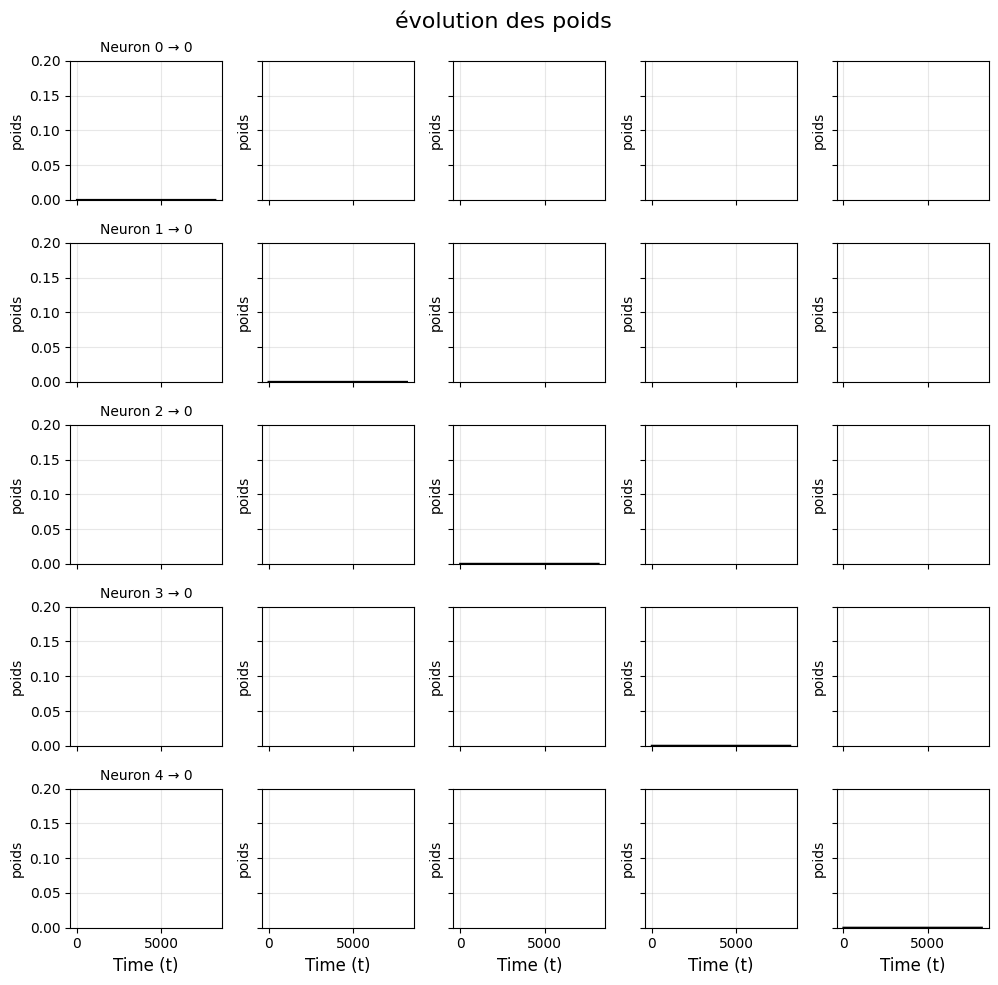

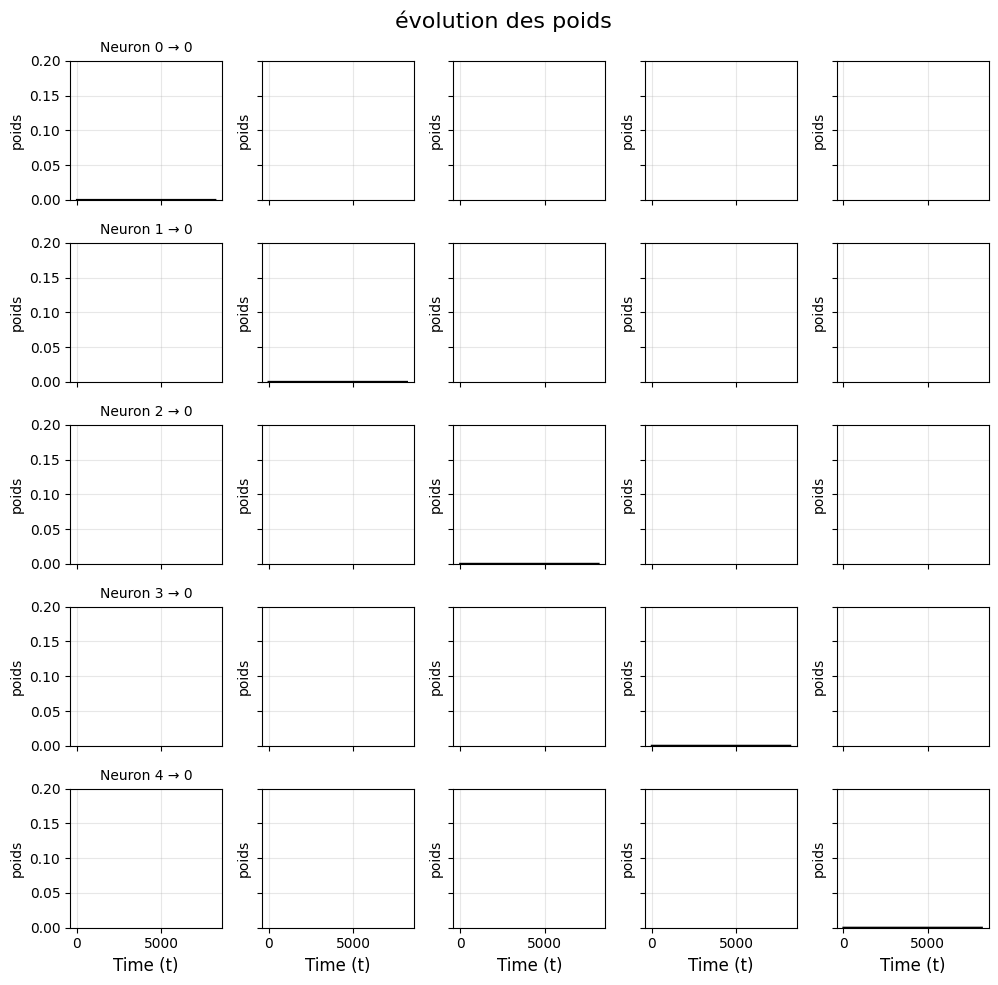

In [13]:
plot_weights(model.W[:, indices0, :][:, :,indices0])
plot_weights(model.W[:, indices1, :][:, :,indices1])
plot_weights(model.W[:, indices2, :][:, :,indices2])

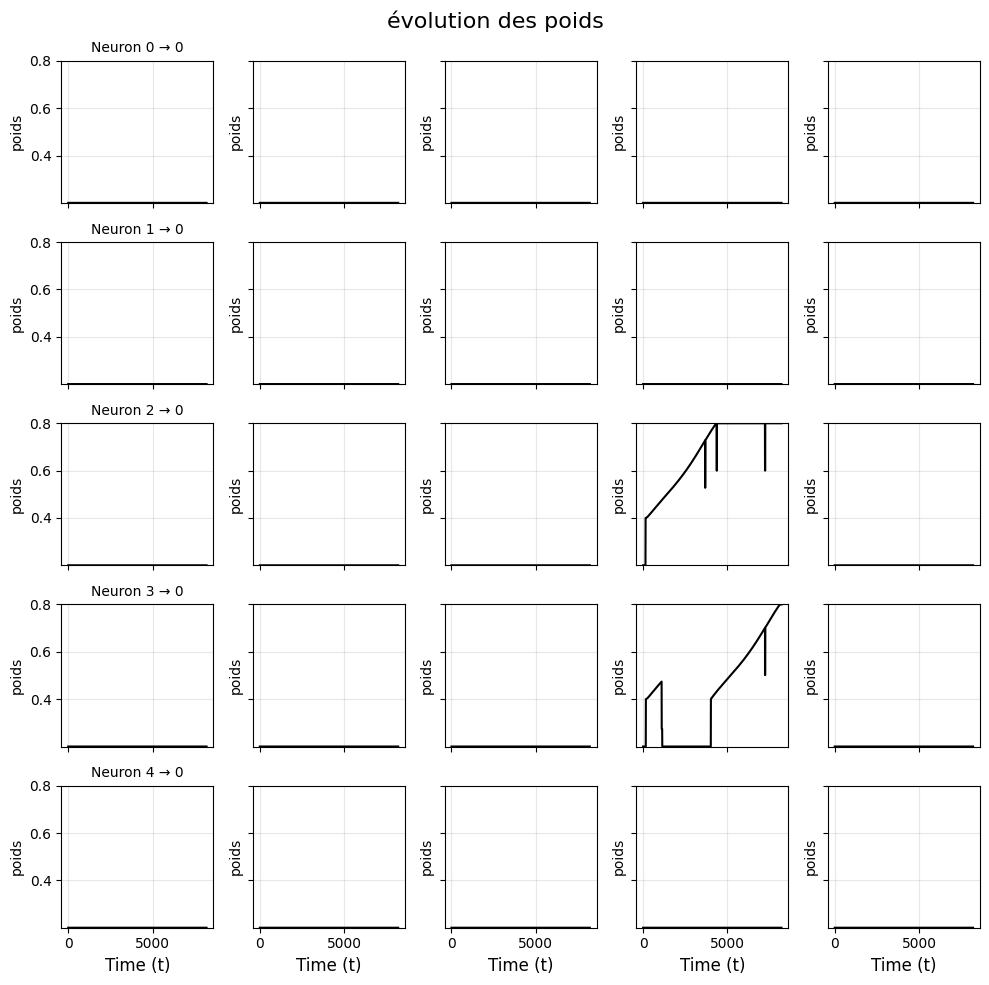

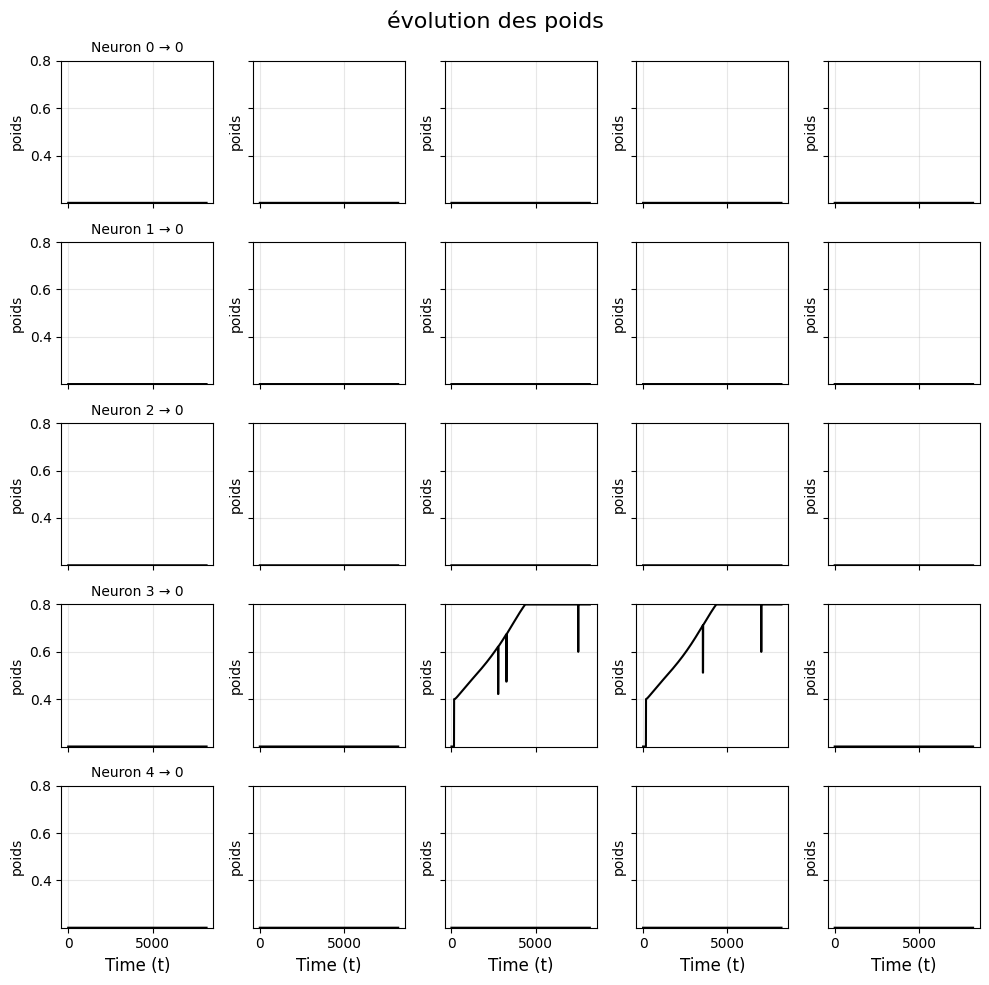

In [14]:
plot_weights(model.W[:, indices0, :][:, :,indices2])
plot_weights(model.W[:, indices2, :][:, :,indices0])

In [70]:
i_, j_, k_ = 0, 1, 14 # indices des neurones à observer
E0 = torch.ones((neurons_per_cluster * (1+(max(i_, j_) // neurons_per_cluster))), device=device) * -torch.inf
E0 = torch.concat((E0, torch.zeros(neurons_per_cluster*(num_clusters - (1+(max(i_, j_) // neurons_per_cluster))), device=device)), dim=0)
E0[i_] = 1
E0[j_] = 1
St_ = torch.cat([
    E0.unsqueeze(0), 
    torch.zeros(N, device=device).unsqueeze(0).repeat(max(nij[-1][i_][k_].item(), nij[-1][j_][k_].item())-1, 1)
    ], dim=0)
res = modèle.run_simulation(St_)
modèle.X[-1]

-------------------------Simulation step 1/5-------------------------------------
_X_(1) tensor([[0.1303, 0.0891, 0.0891, 0.0980, 0.1077, 0.0586, 0.0533, 0.0467, 0.0467,
         0.0319, 0.0709, 0.0709, 0.0891, 0.0645, 0.0780],
        [0.0910, 0.1330, 0.1000, 0.1100, 0.1100, 0.0659, 0.0599, 0.0477, 0.0599,
         0.0395, 0.1000, 0.0725, 0.1000, 0.0797, 0.1000],
        [0.0019, 0.0021, 0.0027, 0.0023, 0.0021, 0.0011, 0.0010, 0.0009, 0.0010,
         0.0007, 0.0017, 0.0013, 0.0016, 0.0013, 0.0017],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.00

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='mps:0')

/var/folders/bm/4s5sh7jj0n3dhylz0n0wmg_w0000gq/T/ipykernel_98471/1505667799.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


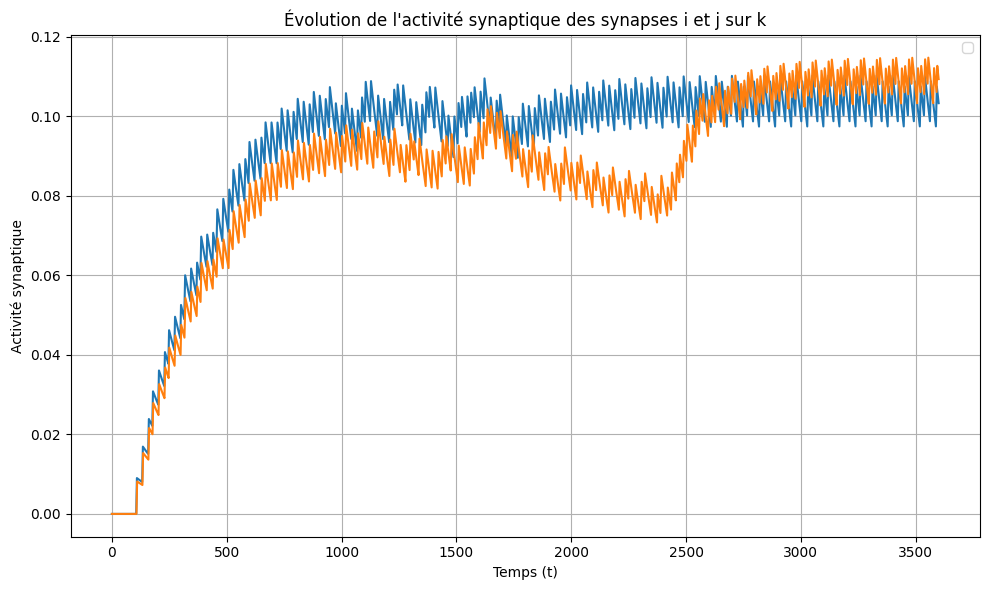

In [26]:
t_ini = 0 #modèle.T_ - 100
t_fini = modèle.data.context.time_steps #modèle.T_
t_ = torch.linspace(t_ini, t_fini, t_fini-t_ini, device=device)
plt.figure(figsize=(10, 6))
plt.plot(t_.cpu().numpy(), modèle.data.auxilary_states.x_[t_ini:t_fini,i_,k_].cpu().numpy(), label='_X_ik')
plt.plot(t_.cpu().numpy(), modèle.data.auxilary_states.x_[t_ini:t_fini,j_,k_].cpu().numpy(), label='_X_jk')
plt.title("Évolution de l'activité synaptique des synapses i et j sur k")
plt.xlabel("Temps (t)")
plt.ylabel("Activité synaptique")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

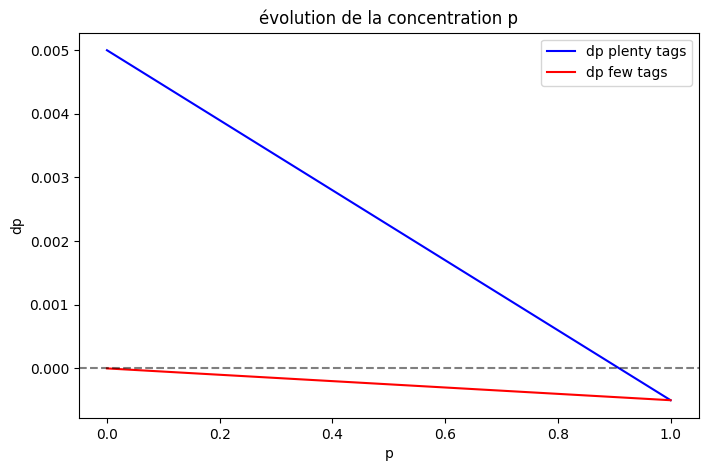

In [163]:
p = torch.linspace(0, 1, 100)
plt.figure(figsize=(8, 5))
plt.plot(p.numpy(), (p * ( 1 - epsilon / tau_P) + epsilon * kP * (1-p) -p).numpy(), label="dp plenty tags", color='blue')
plt.plot(p.numpy(), (p * ( 1 - epsilon / tau_P) -p).numpy(), label="dp few tags", color='red')
#plt.plot(p.numpy(), (p-p).numpy(), label="0", color='orange', linestyle='--')
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.xlabel("p")
plt.ylabel("dp")
plt.title("évolution de la concentration p")
plt.legend()
plt.show()

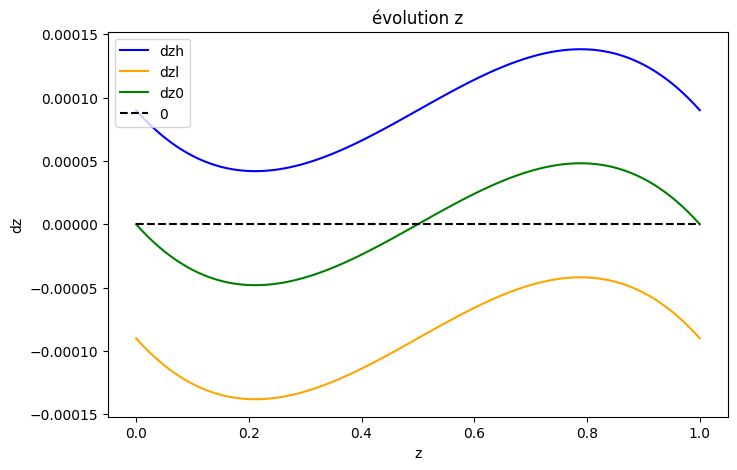

In [ ]:
gamma__ = .1
p__ = 0.9 # point fixe de p si assez de tags
z= torch.linspace(0, 1, 100)
dzh = (z * (z - alpha) * (1-z) + gamma__ * p__) * epsilon / eta_Z
dzl = (z * (z - alpha) * (1-z) - gamma__ * p__) * epsilon / eta_Z
dz0 = (z * (z - alpha) * (1-z)) * epsilon / eta_Z
plt.figure(figsize=(8, 5))
plt.plot(z.numpy(), (dzh).numpy(), label="dzh", color='blue')
plt.plot(z.numpy(), (dzl).numpy(), label="dzl", color='orange')
plt.plot(z.numpy(), (dz0).numpy(), label="dz0", color='green')
plt.plot(z.numpy(), (z-z).numpy(), label="0", color='black', linestyle='--')
plt.xlabel("z")
plt.ylabel("dz")
plt.title("évolution z")
plt.legend()
plt.show()

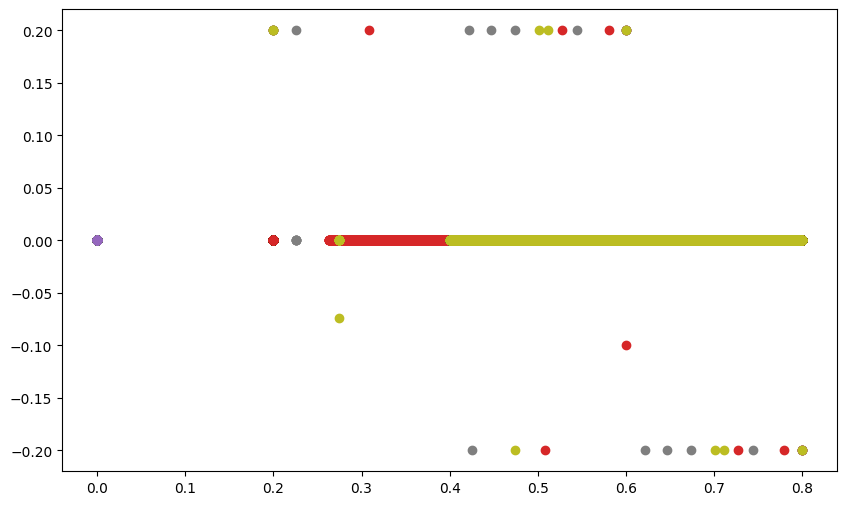

In [194]:
W_1 = model.W[:-1,:,:].cpu().numpy()
W_2 = torch.roll(model.W, -1, 0)[:-1,:,:].cpu().numpy()
plt.figure(figsize=(10, 6))
for i in range(W_1.shape[1]):
    for j in range(W_1.shape[1]):
            plt.plot(W_1[:,i,j], W_2[:,i,j]-W_1[:,i,j], 'o', label=f"W_{i},{j}")
            #plt.text(W_1[i,j], W_2[i,j], f"W_{i},{j}", fontsize=8)
#plt.plot(W_1, (W_2 - W_1), 'o', label=f"W_{i},{j}")
#plt.legend()
plt.show()

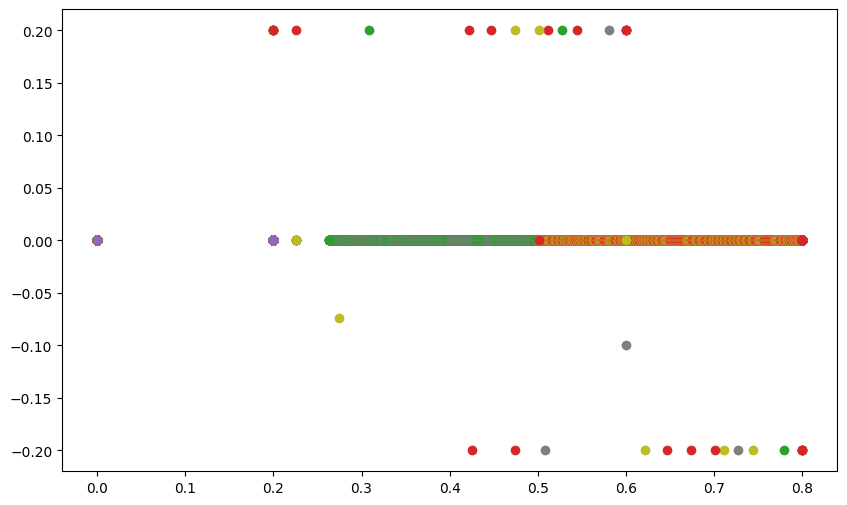

In [191]:
W_1 = model.W[:-1,:,:].cpu().numpy()
W_2 = torch.roll(model.W, -1, 0)[:-1,:,:].cpu().numpy()
plt.figure(figsize=(10, 6))
for i in range(W_1.shape[0]):
    for j in range(W_1.shape[1]):
            plt.plot(W_1[i,j], W_2[i,j]-W_1[i,j], 'o', label=f"W_{i},{j}")
            #plt.text(W_1[i,j], W_2[i,j], f"W_{i},{j}", fontsize=8)
#plt.plot(W_1, (W_2 - W_1), 'o', label=f"W_{i},{j}")
plt.show()

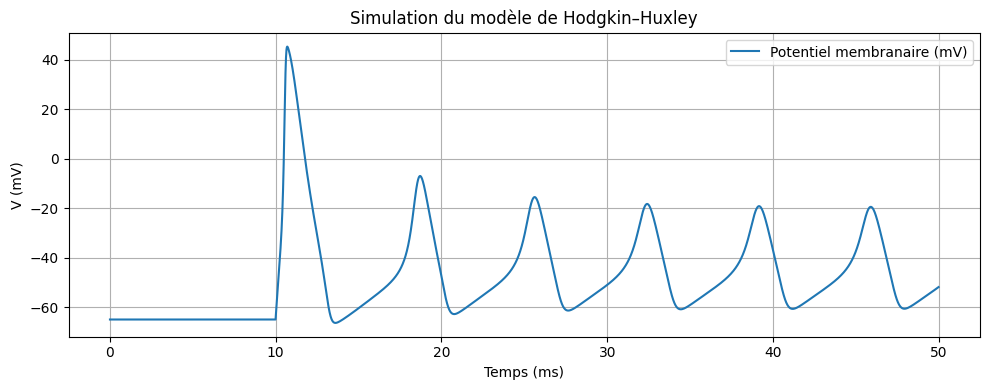

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Paramètres de simulation
dt = 0.01  # pas de temps (ms)
T = 50     # durée totale (ms)
time = np.arange(0, T, dt)

# Paramètres HH
C_m = 1.0     # µF/cm²
g_Na = 120.0  # mS/cm²
g_K = 36.0
g_L = 0.3
E_Na = 50.0   # mV
E_K = -77.0
E_L = -54.387

# Courant injecté (constant)
I_ext = np.zeros_like(time)
I_ext[1000:480000] = 100  # injecté entre 10 et 40 ms

# Fonctions d’activation
def alpha_n(V): return 0.01*(V + 55)/(1 - np.exp(-(V + 55)/10))
def beta_n(V): return 0.125*np.exp(-(V + 65)/80)
def alpha_m(V): return 0.1*(V + 40)/(1 - np.exp(-(V + 40)/10))
def beta_m(V): return 4.0*np.exp(-(V + 65)/18)
def alpha_h(V): return 0.07*np.exp(-(V + 65)/20)
def beta_h(V): return 1/(1 + np.exp(-(V + 35)/10))

# Initialisation
V = -65.0
m = alpha_m(V) / (alpha_m(V) + beta_m(V))
h = alpha_h(V) / (alpha_h(V) + beta_h(V))
n = alpha_n(V) / (alpha_n(V) + beta_n(V))
Vs = []

# Boucle de simulation
for t in time:
    I_Na = g_Na * m**3 * h * (V - E_Na)
    I_K = g_K * n**4 * (V - E_K)
    I_L = g_L * (V - E_L)
    I_ion = I_ext[int(t/dt)] - I_Na - I_K - I_L

    V += dt * I_ion / C_m
    m += dt * (alpha_m(V)*(1 - m) - beta_m(V)*m)
    h += dt * (alpha_h(V)*(1 - h) - beta_h(V)*h)
    n += dt * (alpha_n(V)*(1 - n) - beta_n(V)*n)
    Vs.append(V)

# Affichage
plt.figure(figsize=(10, 4))
plt.plot(time, Vs, label="Potentiel membranaire (mV)")
plt.xlabel("Temps (ms)")
plt.ylabel("V (mV)")
plt.title("Simulation du modèle de Hodgkin–Huxley")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


WARNING    Removing unsupported flag '-march=native' from compiler flags. [brian2.codegen.cpp_prefs]


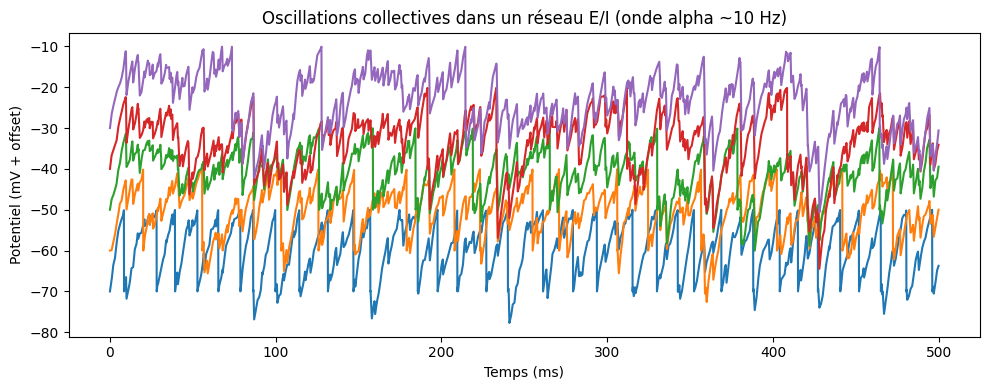

In [10]:
from brian2 import *

# Paramètres de simulation
start_scope()
N_E, N_I = 20, 5
duration = 500*ms

# Paramètres HH simplifiés (modèle adaptatif)
eqs = '''
dv/dt = (I - gL*(v - EL))/Cm : volt
I : amp
'''

Cm = 200*pF
gL = 10*nS
EL = -70*mV

# Groupes neuronaux
G_E = NeuronGroup(N_E, eqs, threshold='v > -50*mV', reset='v = EL', method='euler')
G_I = NeuronGroup(N_I, eqs, threshold='v > -50*mV', reset='v = EL', method='euler')
G_E.v = EL
G_I.v = EL

# Connexions synaptiques
S_EI = Synapses(G_E, G_I, on_pre='I_post += 1.5*nA')
S_IE = Synapses(G_I, G_E, on_pre='I_post -= 2.0*nA')
S_EI.connect(p=0.5)
S_IE.connect(p=0.5)

# Courant d’entrée + bruit
@network_operation(dt=1*ms)
def inject_noise():
    G_E.I = 0.5*nA + 0.2*nA * randn(N_E)
    G_I.I = 0.3*nA + 0.1*nA * randn(N_I)

# Moniteurs
M_E = StateMonitor(G_E, 'v', record=True)
spikes = SpikeMonitor(G_E)

# Simulation
run(duration)

# Affichage
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4))
for i in range(5):
    plt.plot(M_E.t/ms, M_E.v[i]/mV + i*10, label=f'Neuron {i}')
plt.xlabel('Temps (ms)')
plt.ylabel('Potentiel (mV + offset)')
plt.title("Oscillations collectives dans un réseau E/I (onde alpha ~10 Hz)")
plt.tight_layout()
plt.show()
